In [101]:
import os
import pygmt
import meshplex
import rioxarray
import numpy as np
import pandas as pd
import xarray as xr

from scripts import isinside
from scipy.ndimage import gaussian_filter
from gospl._fortran import definegtin, gfill
#!pip install triangle

# Building `goSPL` mesh

First using the `clipped` netcdf file containing the forcing conditions that was created in the previous notebook, we will define our `goSPL` mesh and the tectonic forcing. 

This process will partly change the topography (which is still eTOPO in our case) and will reproject the dataset from lon/lat (degrees) coordinates to UTM (metres). Finally we will interpolate the data to the desired resolution that we wish to use in our simulation.

## Loading forcing dataset

In [2]:
region = [-120,-71,15,45]
dataset = xr.open_dataset('clipped.nc')
elevation = dataset.elevation.values
dataset

<xarray.Dataset>
Dimensions:     (lon: 490, lat: 300)
Coordinates:
  * lon         (lon) float64 -119.9 -119.8 -119.7 -119.6 ... -71.2 -71.1 -71.0
  * lat         (lat) float64 15.1 15.2 15.3 15.4 15.5 ... 44.7 44.8 44.9 45.0
Data variables: (12/22)
    elevation   (lat, lon) float32 -4.218e+03 -4.192e+03 ... 579.8 553.5
    DT0Ma       (lat, lon) float32 ...
    DT1Ma       (lat, lon) float32 ...
    DT2Ma       (lat, lon) float32 ...
    DT3Ma       (lat, lon) float32 ...
    DT4Ma       (lat, lon) float32 ...
    ...          ...
    DT15Ma      (lat, lon) float32 ...
    DT16Ma      (lat, lon) float32 ...
    accuSedMio  (lat, lon) float64 ...
    accuSed     (lat, lon) float64 ...
    tectonic    (lat, lon) float64 ...
    topadjust   (lat, lon) float64 ...

## Remove dynamic topography contribution

We sum the impact of dynamic topography since the mid-Miocene and will remove it from the initial surface:

In [3]:
for k in range(16):
    if k == 0:
        cum_dyn_topo = dataset["DT"+str(int(k))+"Ma"].values - dataset["DT"+str(int(k+1))+"Ma"].values
    elif k == 15:
        cum_dyn_topo = 0.6*(dataset["DT"+str(int(k))+"Ma"].values - dataset["DT"+str(int(k+1))+"Ma"].values)
    else:
        cum_dyn_topo += dataset["DT"+str(int(k))+"Ma"].values - dataset["DT"+str(int(k+1))+"Ma"].values
        
elevMio = dataset.elevation.values - cum_dyn_topo

dataset['cumDT'] = (['lat', 'lon'],  cum_dyn_topo)

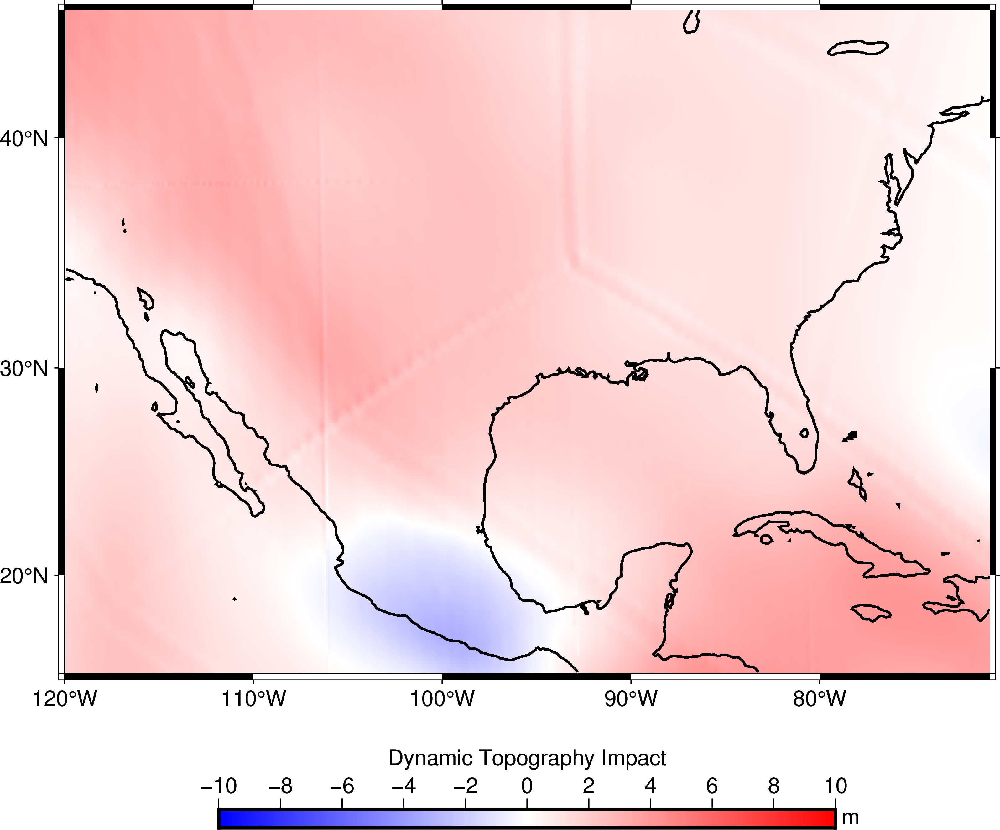

In [4]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black', COLOR_FOREGROUND="red", COLOR_BACKGROUND="blue"):
    pygmt.makecpt(cmap="polar", series=[-10, 10])
    fig.basemap(region=region, projection='M15c', frame='a')    
    fig.grdimage(dataset.cumDT, shading=False, frame=False)
    fig.grdcontour( interval=0.1, grid=dataset.elevation, limit=[-0.1, 0.1], pen='1.p')
    fig.colorbar(frame=["a2", 'x+l"Dynamic Topography Impact"', "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=600)

We also get the tectonic associated to the dynamic topography for the simulated period (15.6 Ma to 12 Ma), `goSPL` requires the tectonic to be in `m/yr`:

In [5]:
dynTopo = []
for k in range(15,11, -1):
    if k == 15:
        dynTopo.append(0.6*(dataset["DT"+str(int(k))+"Ma"].values - 
                            dataset["DT"+str(int(k+1))+"Ma"].values)*1.e-6)
    else:
        dynTopo.append((dataset["DT"+str(int(k))+"Ma"].values - 
                        dataset["DT"+str(int(k+1))+"Ma"].values)*1.e-6)

## Adding topographic adjustment

If one has defined an adjustment of the topography based on paleo-elevation dataset using some polygons created with GPlates, we will then readjust the initial topography. Here this dataset has been provided in our xarray (variable: `topadjust`)

In [6]:
elevMio += dataset["topadjust"].values

## Adding additional tectonic drivers

We will also as an example add other tectonic forcings:

+ uplift of the continental ranges stored in the `tectonic` variables (here in m/Ma)
+ subsidence in the depocenters assumed to be defined by the `accuSedMio` variables for the simulated period (e.g. the sediment accumulation for the mid miocene spans over 5 Myr from 16 Ma to 11 Ma)

We will construct the tectonics as 4 scenarios (following the dynamic topography list `dynTopo`, one from 15.6 to 15 Ma , one from 15 Ma to 14 Ma, one from 14 Ma to 13 Ma and finally one from 13 Ma to 12 Ma)

In [7]:
tot_Tecto = []
for k in range(len(dynTopo)):
    # tectonic in m/yr + dynamic topography in m/yr + subsidence in m/yr (sediment accumulation for 5 Ma)
    tecto = dataset['tectonic'].values*1.e-6 + dynTopo[k] - dataset['accuSedMio'].values/5.e6
    tot_Tecto.append(tecto)
    if k == 0:
        cumDisp = tecto*1.e6*0.6 # 0.6 Ma for the first scenario
    else:
        cumDisp += tecto*1.e6 # 1 Ma for the others

dataset['cumDisp'] = (['lat', 'lon'],  cumDisp)

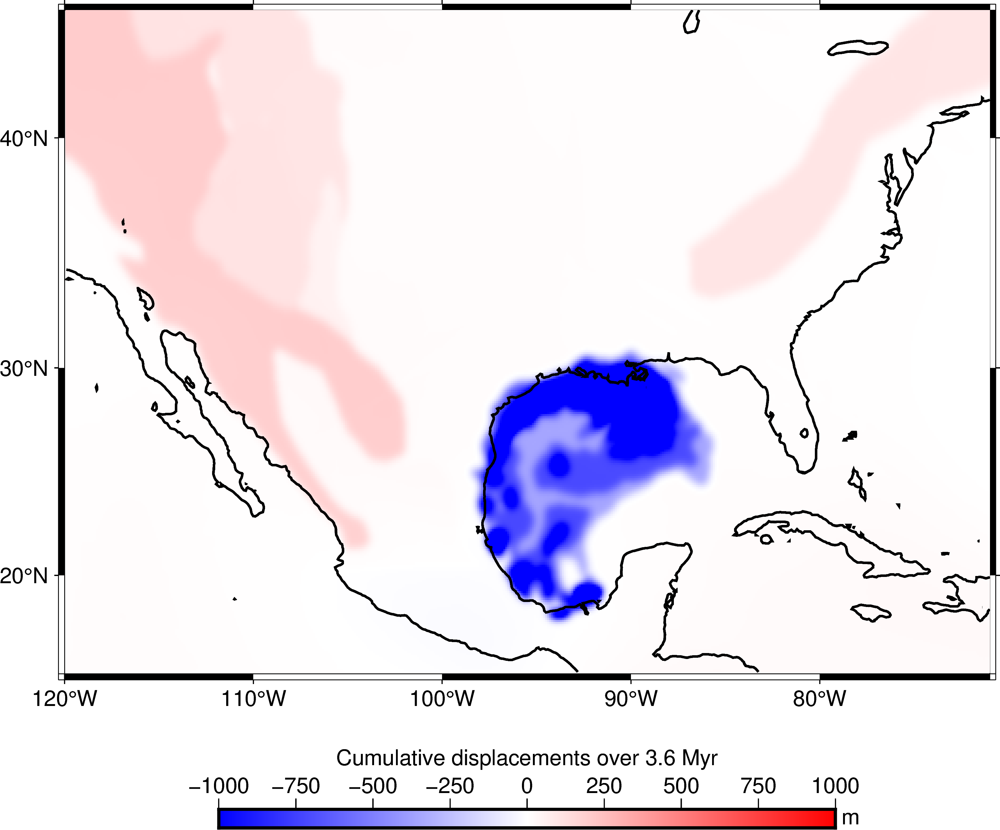

In [8]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black', COLOR_FOREGROUND="red", COLOR_BACKGROUND="blue"):
    pygmt.makecpt(cmap="polar", series=[-1000, 1000])
    fig.basemap(region=region, projection='M15c', frame='a')    
    fig.grdimage(dataset.cumDisp, shading=False, frame=False)
    fig.grdcontour( interval=0.1, grid=dataset.elevation, limit=[-0.1, 0.1], pen='1.p')
    fig.colorbar(frame=["a250", 'x+l"Cumulative displacements over 3.6 Myr"', "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=600)

### Storing topography, forcings and dataset

In [9]:
# The adjusted elevation 
tmp = xr.Dataset({
    'elev0': xr.DataArray(
                data   = elevMio,   
                dims   = ['lat','lon'],
                coords = {'lon': dataset.lon.values, 'lat':dataset.lat.values},
                ),
            },
    )

# The tectonic forcing for each interval (4 in total)
for k in range(len(tot_Tecto)):
    tmp['tec'+str(k)] = (['lat', 'lon'],  tot_Tecto[k])

tmp.rio.write_crs(4326, inplace=True)
ds = tmp.rename({'lon': 'x','lat': 'y'})

## Reprojecting the dataset to UTM

To do so we will use `rioxarray` and first we will need to add a `CRS` (coordinate reference system) to the dataset.

Then using the library we can estimate the corresponding UTM zone:

+ EPSG:32615 - WGS 84 / UTM zone 15N

In [10]:
epsg = ds.rio.estimate_utm_crs()
epsg

CRS.from_epsg(32615)

We can now reproect the dataset to the corresponding UTM

In [11]:
ds_utm = ds.rio.reproject(epsg)

We can display the reprojected dataset:

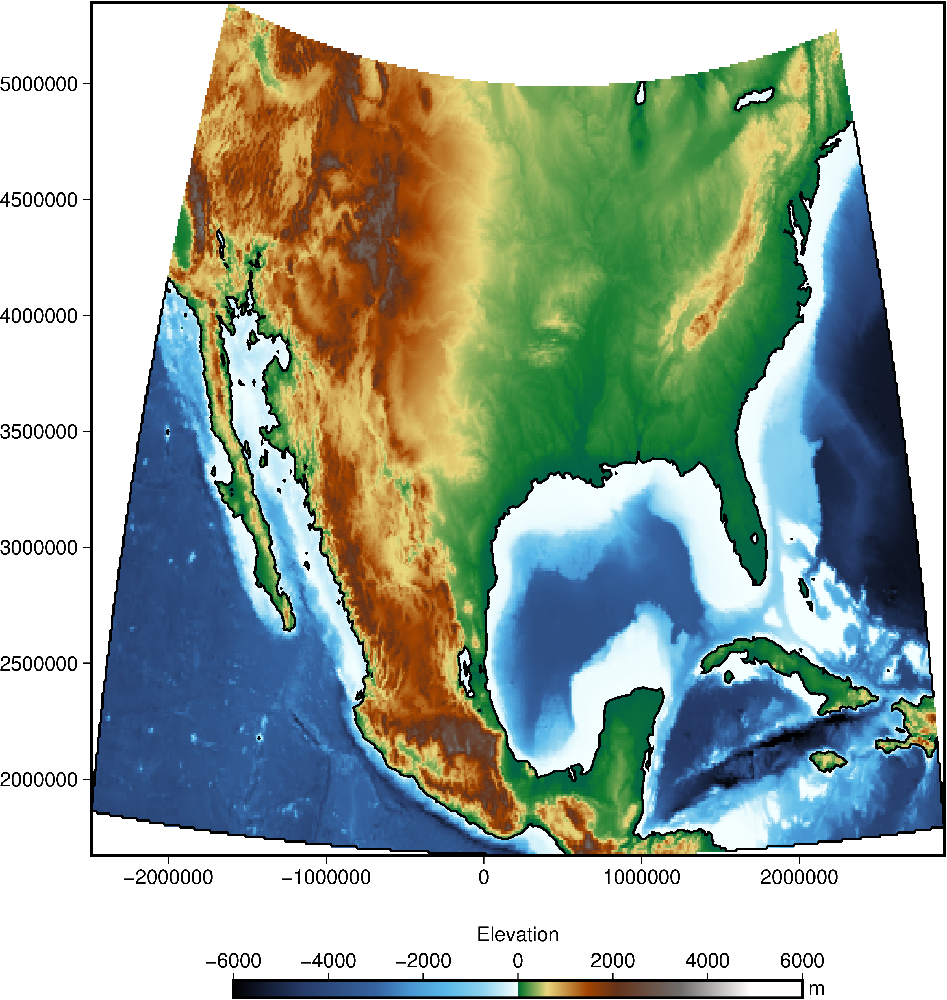

In [12]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(ds_utm.elev0, shading=False, frame='a')
    fig.grdcontour(interval=0.1, grid=ds_utm.elev0, limit=[-0.1, 0.1], pen='1.p')
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=600)

We will now clip it so remove the `nan` values (yellow regions above) 

In [13]:
geometries = [
    {
        'type': 'Polygon',
        'coordinates': [[
            [-1.75e6, 2.e6],
            [2.1e6, 2.e6],
            [2.1e6, 4.95e6],
            [-1.75e6, 4.95e6]
        ]]
    }
]
clipped = ds_utm.rio.clip(geometries)
print('Bound values: ',clipped.elev0.values.min(),clipped.elev0.values.max())

/Users/getafix/anaconda3/envs/gospl/lib/python3.9/site-packages/rioxarray/raster_writer.py:108: UserWarning: The nodata value (3.402823466e+38) has been automatically changed to (3.4028234663852886e+38) to match the dtype of the data.
  warnings.warn(


Bound values:  -7768.72 3543.5005


From the max value above we see that the model now does not have any `nan` values anymore!

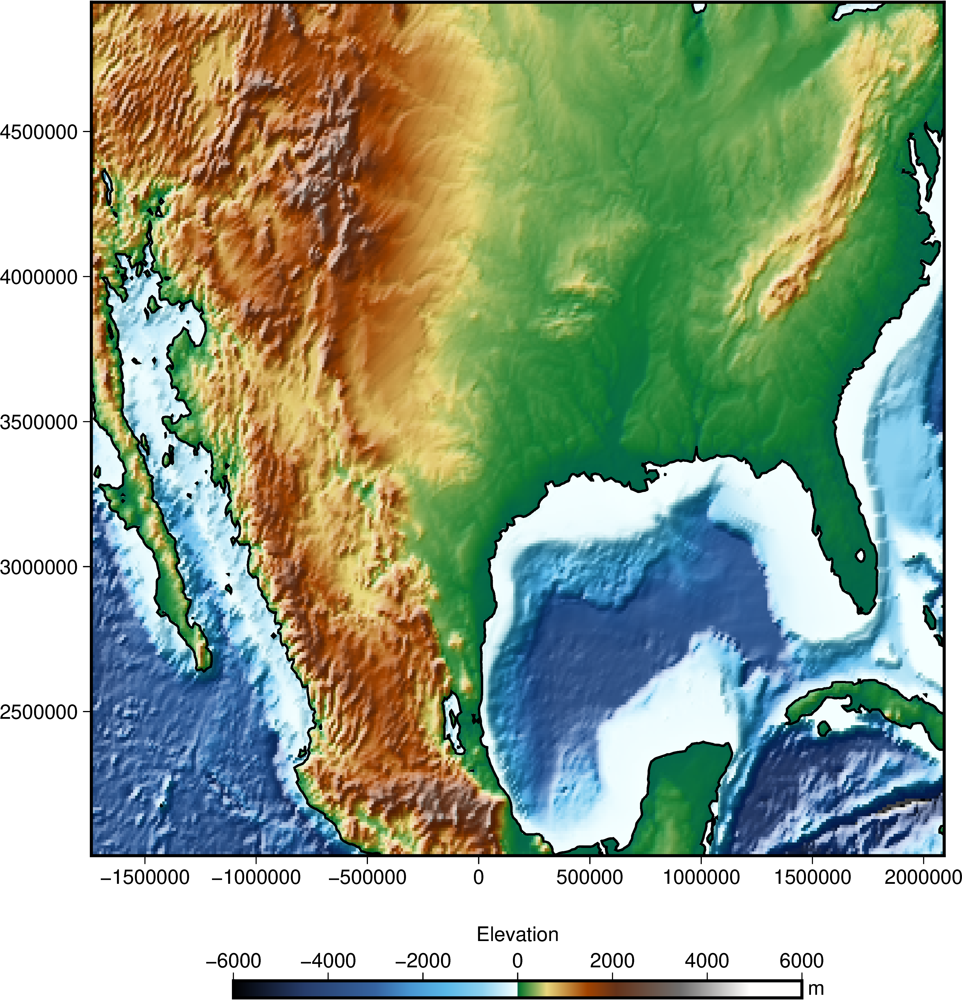

In [14]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(clipped.elev0, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=clipped.elev0, limit=[-0.1, 0.1], pen='1.p')
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

## Resampling the dataset to desired resolution

First let us have a look at the extent and resolution of the current dataset:

In [15]:
print('bounding box :',clipped.rio.bounds())
print('resolution :',clipped.rio.resolution())

bounding box : (-1745501.8123471201, 1998069.2360440562, 2096584.416814623, 4950409.180557817)
resolution : (10110.753234636166, -10110.753234636168)


We will now specify our desired resolution and bounding box and perform the interpolation:

In [16]:
res = 2500.0 # 2.5 km
bbox = [-1735000, 2005000, 2085000, 4940000]

newx = np.arange(bbox[0],bbox[2]+res,res)
newy = np.arange(bbox[1],bbox[3]+res,res)

interpData = clipped.interp(x=newx, y=newy, method="linear")

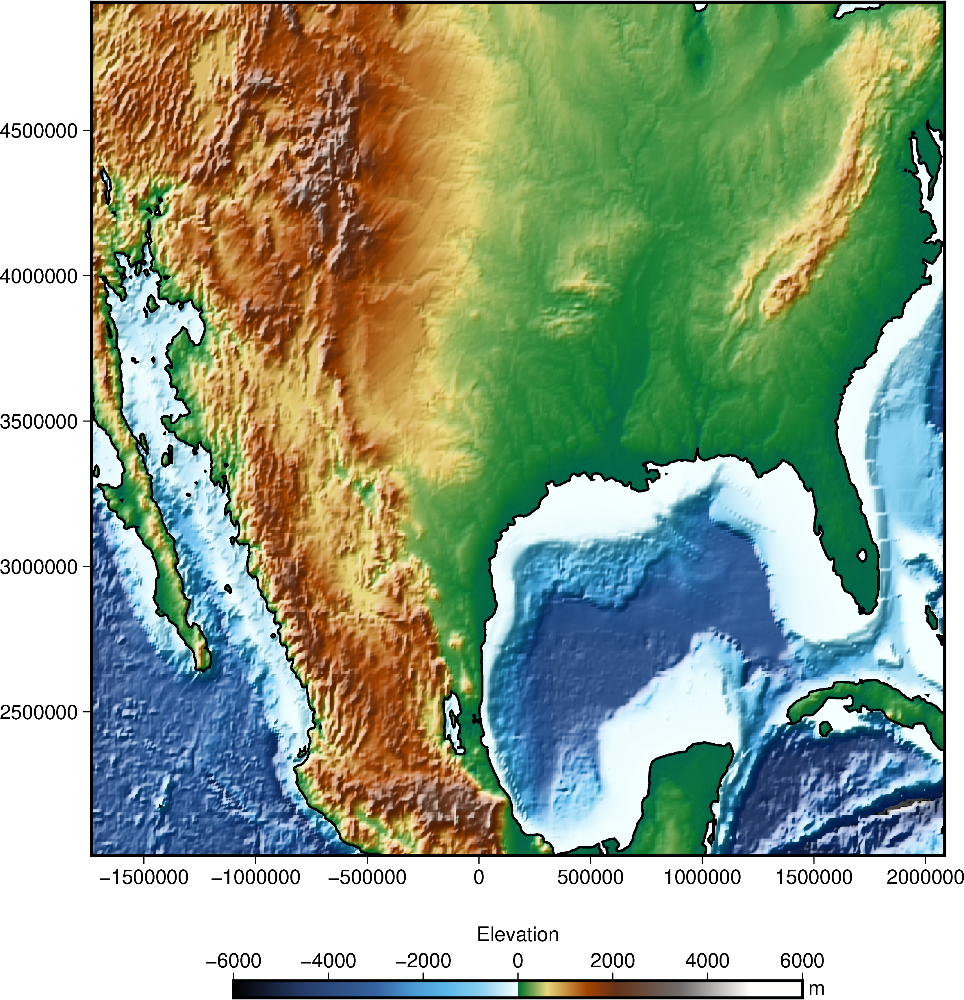

In [17]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(interpData.elev0, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=interpData.elev0, limit=[-0.1, 0.1], pen='1.p')
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

Let's define the regular mesh coordinates:

In [18]:
rx = interpData.x.values
ry = interpData.y.values
rx, ry = np.meshgrid(interpData.x.values,interpData.y.values)
rPts = np.stack((rx.ravel(), ry.ravel())).T
rshape = rx.shape

# Additional modifications of the initial topography

Until now, we have slightly modified the topography that was created using `eTOPO`. We have removed the dynamic topography component and also made some adjustment (mainly increasing/decreasing the elevation around the main ranges found in the region).

In cases where additional information are available to us such as paleo-coastline position or paleo-drainages we might want to refine our initial topography to reflect these dataset.

Here we illustrate how this is could be done.

## Forcing topography to match with initial paleo-coastline

We will use paleo-coastline to evaluate coordinates that should be above and below sea-level at the start of our simulation and change the topography to match with the paleo-coastline position:

In [19]:
file = "inputs/GPlates/coastline.gpml"

# Coastline resolution (m)
cres = 2500. 

# We define a minimal slope (1.e-6) to ensure that elevation is either below or 
# above the paleo-coastline at the start of our simulation
mslp = 1.e-6 

sl = 0 # Sea-level position (m) that needs to be assigned to the position at the given time interval

coast, nelev = isinside.getCoast(file, rPts, interpData.elev0.values-sl, 
                          "epsg:4326", "epsg:32615", cres, mslp)

interpData["nelev"]=(['y', 'x'],  nelev)

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Let's plot the new elevation and the paleo-coastline (red) to see what we've just done:

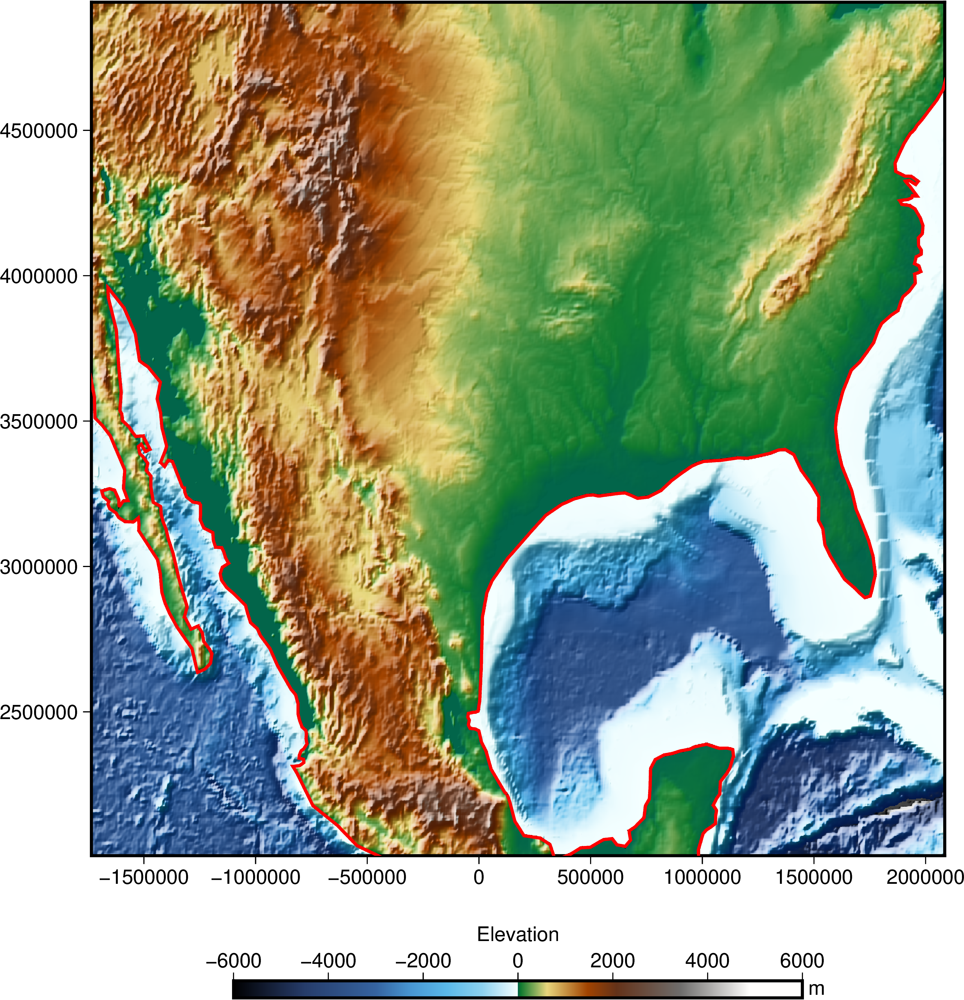

In [20]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(interpData.nelev, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=interpData.nelev, limit=[-0.1e-6, 0.1e-6], pen='1.p')
    fig.plot(x=coast[:,0], y=coast[:,1], pen="1.5p,red", )
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

## Forcing topography to match with paleo-drainages

Finally, we will now impose on our initial surface some paleo-drainages, we start by reading the corresponding `gpml` file containing river position in lon/lat and reprojecting it for our region:

In [21]:
file = "inputs/GPlates/rivers.gpml"
riverdf = isinside.getRivers(file, "epsg:4326", "epsg:32615")

The `gpml` should be created so that each trunk are defined from the river mouth to the headwaters. In the case where this has not been done properly you will have to manually combine the trunks together to form _continuous_, in the case here this wasn't done properly... 

As a result the following piece of code might require some modifications in the future!

In [22]:
# Manual connection should not be necessary if you follow what is explained above!
trunkID = []

trunkID.append([0,1,2,3,4,5])
trunkID.append([0,1,2,3,4,8])
trunkID.append([0,1,2,3,7])
trunkID.append([0,1,2,6])

trunkID.append([0,1,9,10,11,12])
trunkID.append([0,1,9,10,11,17])
trunkID.append([0,1,9,10,14,15])
trunkID.append([0,1,9,10,14,16])
trunkID.append([0,1,9,13])

trunkID.append([18,19,20,21,22,23])
trunkID.append([18,19,20,21,22,26])
trunkID.append([18,19,20,21,25])
trunkID.append([18,19,20,24])

trunkID.append([18,19,27,28,29,30])
trunkID.append([18,19,27,28,29,33])
trunkID.append([18,19,27,28,32])
trunkID.append([18,19,27,31])

trunkID.append([34,35,36,37,38,42,43])
trunkID.append([34,35,36,37,38,42,44])
trunkID.append([34,35,36,37,38,39])
trunkID.append([34,35,36,37,41])
trunkID.append([34,35,36,40])

trunkID.append([34,35,45,46,47])
trunkID.append([34,35,45,46,49])
trunkID.append([34,35,45,48])

# Something else needs to be done...

We will now compute the elevation along each river to ensure downstream flow direction:

In [23]:
# Along river resolution (m)
rres = 250.

# Minimum river slope to ensure downstream transport
rslp = -1.e-6

elevRiv = isinside.riverElev(riverdf, trunkID, nelev, rPts, rres, rslp)

Let's visualise the main paleo-rivers that will be used to force our initial elevation:

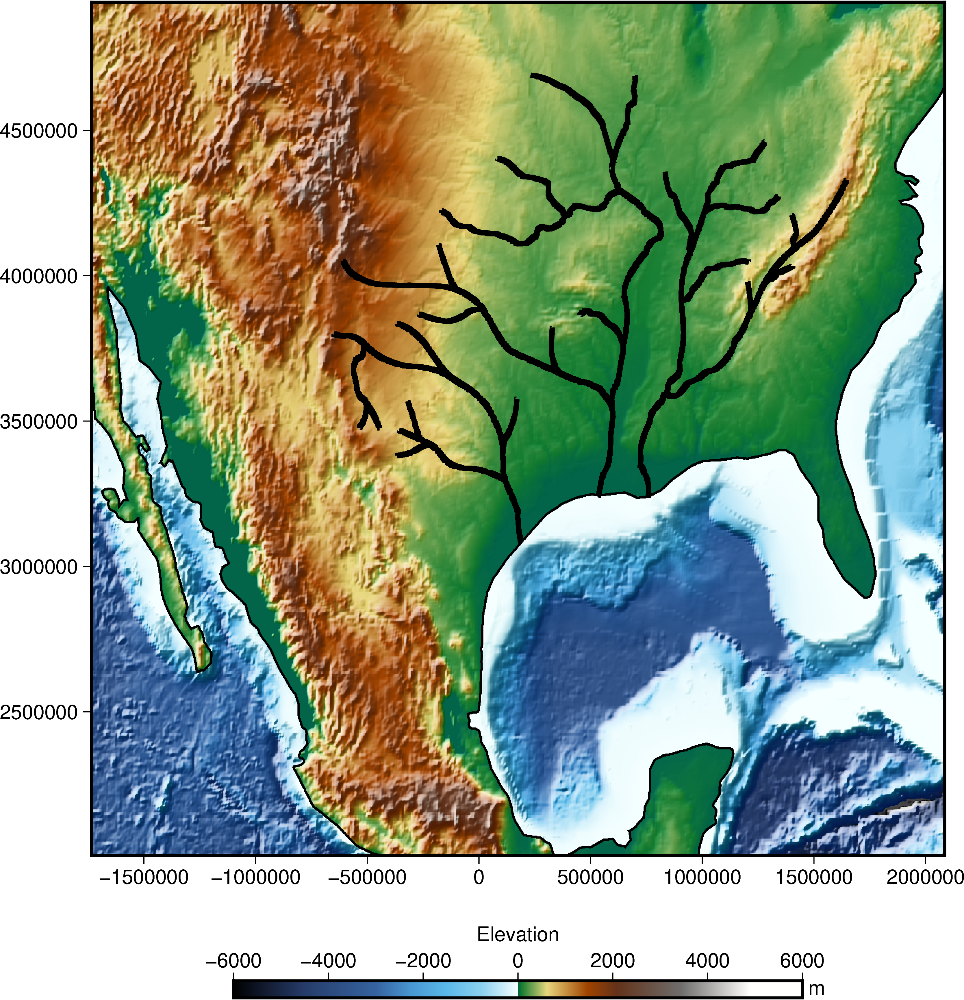

In [24]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(interpData.nelev, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=interpData.nelev, limit=[-0.1e-6, 0.1e-6], pen='1.p')
    for k in range(len(elevRiv)):
        fig.plot(x=elevRiv[k]['x'], y=elevRiv[k]['y'], pen="2.5p,black", )
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

And a specific river (blue is the initial elevation and orange the adjusted one to ensure downstream river flow)

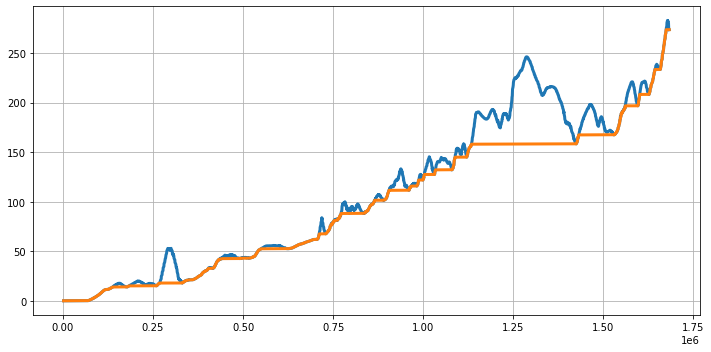

In [26]:
import matplotlib
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
ax = plt.gca()

# You can change the river ID here
river = 4
plt.plot(elevRiv[river].d, elevRiv[river].h, lw=3)
plt.plot(elevRiv[river].d, elevRiv[river].nh, lw=3)

plt.grid()
plt.tight_layout()
plt.show()

Now that we have the elevation of our river floor we will create valleys around each river centerline:

In [52]:
from scipy import spatial
valley_width = 15000. # in metres should be at least 3 times your requested resolution

tree = spatial.cKDTree(rPts, leafsize=10)
valleyZ = np.zeros(len(rPts))

for k in range(len(elevRiv)):
    tmpZ = elevRiv[k].nh.values
    coordsRiv = np.vstack((elevRiv[k].x.values,elevRiv[k].y.values)).T
    ids = tree.query_ball_point(coordsRiv, r=valley_width)
    for p in range(len(ids)):
        valleyZ[ids[p]] = tmpZ[p]

We smooth the valley depth 

In [81]:
updateZ = valleyZ.reshape(rshape)
updateZ = gaussian_filter(updateZ, sigma=5)
updateZ[updateZ<0] = 0.
interpData["valleys"]=(['y', 'x'],  updateZ)

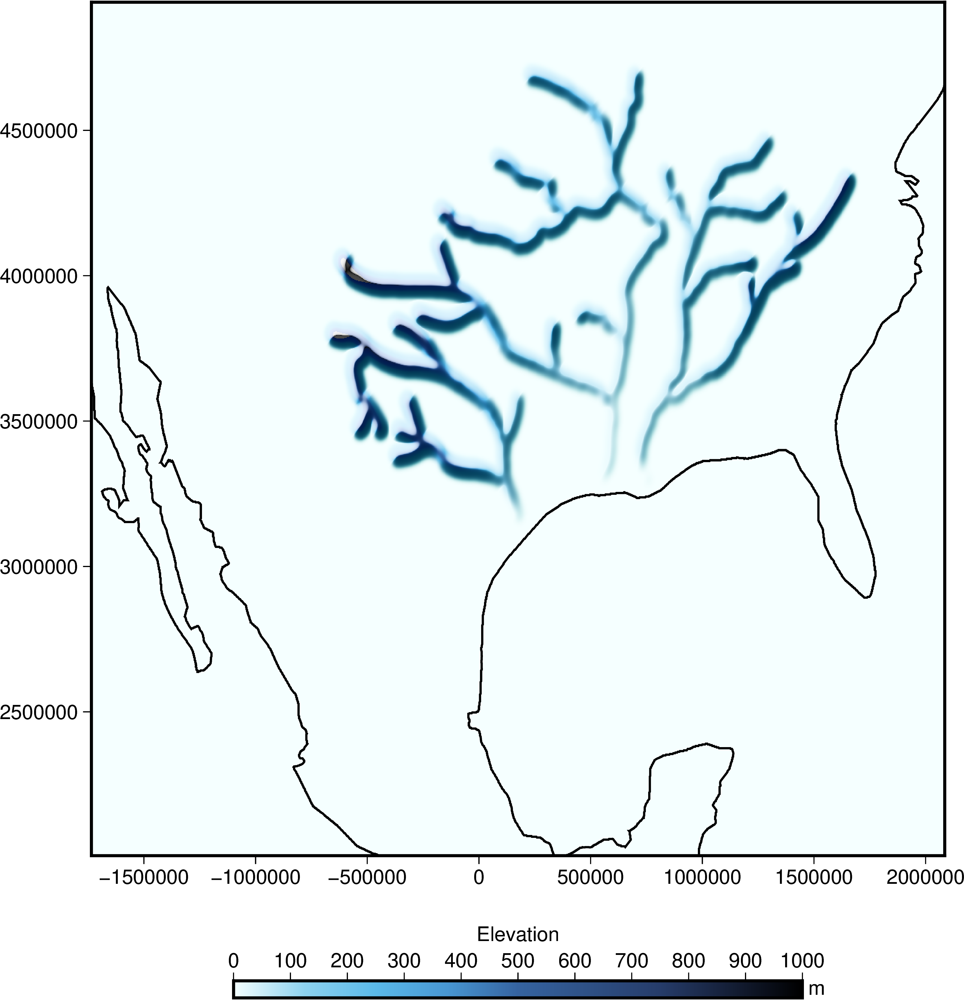

In [82]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="abyss", series=[-0, 1000], reverse=True) 
    fig.grdimage(interpData.valleys, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=interpData.nelev, limit=[-0.1e-6, 0.1e-6], pen='1.p')
    fig.colorbar(frame=["a100", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

We will now add these valleys on our elevation grid:

In [83]:
topo0 = nelev - updateZ 
topo0 = gaussian_filter(topo0, sigma=3)
topo0[nelev>0.] = nelev[nelev>0.]
interpData["topo0"]=(['y', 'x'],  topo0)

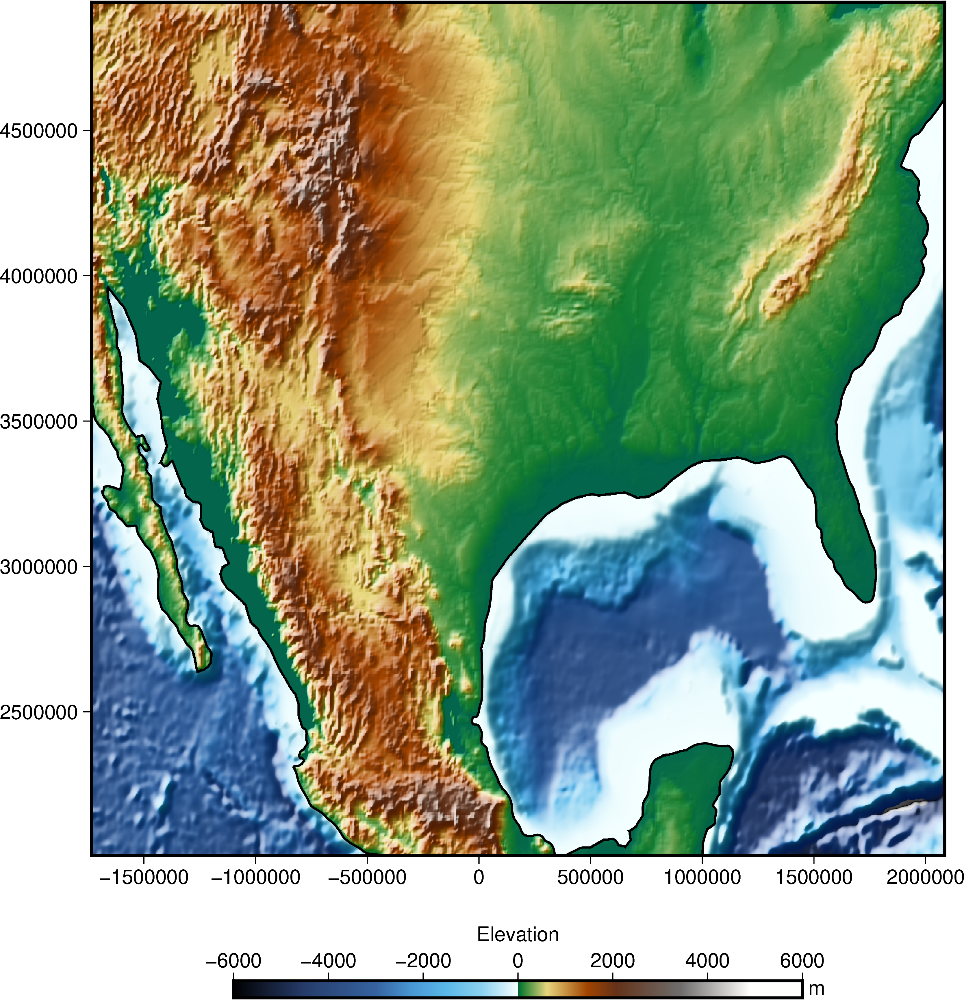

In [86]:
fig = pygmt.Figure()
with pygmt.config(FONT='10p,Helvetica,black'):
    pygmt.makecpt(cmap="geo", series=[-6000, 6000]) 
    fig.grdimage(interpData.topo0, shading=True, frame='a')
    fig.grdcontour(interval=0.1, grid=interpData.topo0, limit=[-0.1e-6, 0.1e-6], pen='1.p')
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h") #position="JMR+o0.5c/0c+w8c")
fig.show(dpi=500, width=500)

## Building `goSPL` mesh

We have everything we need to run our model now, so we will build the required input files for our simulation!

Let's first create our `goSPL` mesh: 2D points coordinates and cells (this defines a triangular mesh)

In [88]:
pts2D, cells = isinside.delaunayMesh(bbox, res)

We will now interpolate our regular mesh dataset on our `goSPL` mesh, first we find the closest points in the regular mesh which are the closest to the irregular ones:

In [90]:
# Create kdtree...
tree = spatial.cKDTree(rPts)
distances, indices = tree.query(pts2D, k=3)

# Inverse weighting distance...
weights = np.divide(
    1.0, distances ** 2, out=np.zeros_like(distances), where=distances != 0
)
sumweights = np.sum(weights, axis=1)

onIDs = np.where(sumweights == 0)[0]
sumweights[sumweights == 0] = 1.0e-4

Then we interpolate the dataset (elevation and tectonics):

In [93]:
# data to interpolate
elev0 = topo0.flatten()
zMesh = np.sum(weights * elev0[indices][:, :], axis=1) / sumweights
if len(onIDs)>0:
    zMesh[onIDs] = elev0[indices[onIDs,0]]

tecMesh = []
for k in range(4):
    tmpTec = interpData['tec'+str(int(k))].values.flatten()
    tec = np.sum(weights * tmpTec[indices][:, :], axis=1) / sumweights
    if len(onIDs)>0:
        tec[onIDs] = tmpTec[indices[onIDs,0]]
    tecMesh.append(tec)

Finally we write the corresponding files:

In [106]:
# name of the folder where the inputs would be stored
mesh_path = 'inputs/gospl'
if not os.path.exists(mesh_path):
    os.makedirs(mesh_path)

In [107]:
coords = np.zeros((len(zMesh),3))
coords[:,:2] = pts2D

# Set meshplex triangular mesh
Gmesh = meshplex.MeshTri(coords, cells)
s = Gmesh.idx_hierarchy.shape
a = np.sort(Gmesh.idx_hierarchy.reshape(s[0], -1).T)
Gmesh.edges = {"points": np.unique(a, axis=0)}

# Get each vertice neighbours indices
_, Ngbs = definegtin(len(coords), cells, Gmesh.edges["points"])

# Remove small pits (below 10 m depth) 
fillz = gfill(-3000., zMesh, Ngbs, 10.)

In [108]:
# Elevation 
elevfname = mesh_path+"/mesh2D"
np.savez_compressed(elevfname, v=coords, c=cells, 
                    n=Ngbs[:, :8].astype(int), z=fillz)

# Tectonics
for k in range(4):
    tecfname = mesh_path+"/tecto"+str(int(k))
    np.savez_compressed(tecfname, z=tecMesh[k])

### Cherry on the cake

Potentially you might want to create a `vtk` file that can be visualised in Paraview to see if everything worked as expected...

In [110]:
import meshio
vis_mesh = meshio.Mesh(coords, {"triangle": cells},
                       point_data={"elev": fillz,
                                  "tec0": tecMesh[0],
                                  "tec1": tecMesh[1],
                                  "tec2": tecMesh[2],
                                  "tec3": tecMesh[3],
                                  })
meshio.write('iniElevation.vtk', vis_mesh)